# Importing Necessary Libraries And Dataset

In [192]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
import plotly.graph_objects as go
from scipy.stats import norm
from plotly.offline import download_plotlyjs,init_notebook_mode,plot,iplot
import cufflinks as cf
from plotly.offline import download_plotlyjs,init_notebook_mode,plot,iplot
init_notebook_mode(connected=True)
cf.go_offline()
import random
from sklearn.cluster import DBSCAN
import matplotlib.pyplot as plt
import numpy as np
from scipy.stats import norm
from scipy.stats import t
from scipy.stats import zscore
from scipy import stats
from sklearn import preprocessing 
from sklearn.metrics import classification_report
import warnings
warnings.filterwarnings('ignore')

In [2]:
data=pd.read_csv("adult.csv")

# Data Description

In [3]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 48842 entries, 0 to 48841
Data columns (total 15 columns):
 #   Column           Non-Null Count  Dtype 
---  ------           --------------  ----- 
 0   age              48842 non-null  int64 
 1   workclass        48842 non-null  object
 2   fnlwgt           48842 non-null  int64 
 3   education        48842 non-null  object
 4   educational-num  48842 non-null  int64 
 5   marital-status   48842 non-null  object
 6   occupation       48842 non-null  object
 7   relationship     48842 non-null  object
 8   race             48842 non-null  object
 9   gender           48842 non-null  object
 10  capital-gain     48842 non-null  int64 
 11  capital-loss     48842 non-null  int64 
 12  hours-per-week   48842 non-null  int64 
 13  native-country   48842 non-null  object
 14  income           48842 non-null  object
dtypes: int64(6), object(9)
memory usage: 5.6+ MB


In [4]:
data.describe()

,age,fnlwgt,educational-num,capital-gain,capital-loss,hours-per-week
count,48842.000000,4.884200e+04,48842.000000,48842.000000,48842.000000,48842.000000
mean,38.643585,1.896641e+05,10.078089,1079.067626,87.502314,40.422382
std,13.710510,1.056040e+05,2.570973,7452.019058,403.004552,12.391444
min,17.000000,1.228500e+04,1.000000,0.000000,0.000000,1.000000
25%,28.000000,1.175505e+05,9.000000,0.000000,0.000000,40.000000
50%,37.000000,1.781445e+05,10.000000,0.000000,0.000000,40.000000
75%,48.000000,2.376420e+05,12.000000,0.000000,0.000000,45.000000
max,90.000000,1.490400e+06,16.000000,99999.000000,4356.000000,99.000000


# Data

In [5]:
data.tail()

,age,workclass,fnlwgt,education,educational-num,marital-status,occupation,relationship,race,gender,capital-gain,capital-loss,hours-per-week,native-country,income
48837,27,Private,257302,Assoc-acdm,12,Married-civ-spouse,Tech-support,Wife,White,Female,0,0,38,United-States,<=50K
48838,40,Private,154374,HS-grad,9,Married-civ-spouse,Machine-op-inspct,Husband,White,Male,0,0,40,United-States,>50K
48839,58,Private,151910,HS-grad,9,Widowed,Adm-clerical,Unmarried,White,Female,0,0,40,United-States,<=50K
48840,22,Private,201490,HS-grad,9,Never-married,Adm-clerical,Own-child,White,Male,0,0,20,United-States,<=50K
48841,52,Self-emp-inc,287927,HS-grad,9,Married-civ-spouse,Exec-managerial,Wife,White,Female,15024,0,40,United-States,>50K


In [6]:
pdata = data.copy()


# From Data

In [7]:
print("Total number of unique workclass {} : {}".format(len(data['workclass'].unique()),data['workclass'].unique()))

Total number of unique workclass 9 : ['Private' 'Local-gov' '?' 'Self-emp-not-inc' 'Federal-gov' 'State-gov'
 'Self-emp-inc' 'Without-pay' 'Never-worked']


In [8]:
print("Total number of unique education {} {}".format(len(data['education'].unique()),data['education'].unique()))

Total number of unique education 16 ['11th' 'HS-grad' 'Assoc-acdm' 'Some-college' '10th' 'Prof-school'
 '7th-8th' 'Bachelors' 'Masters' 'Doctorate' '5th-6th' 'Assoc-voc' '9th'
 '12th' '1st-4th' 'Preschool']


In [9]:
print("Total number of unique marital-status {} : {}".format(len(data['marital-status'].unique()),list(data['marital-status'].unique())))

Total number of unique marital-status 7 : ['Never-married', 'Married-civ-spouse', 'Widowed', 'Divorced', 'Separated', 'Married-spouse-absent', 'Married-AF-spouse']


In [10]:
print("Total number of unique occupation {} : {}".format(len(data['occupation'].unique()),list(data['occupation'].unique())))

Total number of unique occupation 15 : ['Machine-op-inspct', 'Farming-fishing', 'Protective-serv', '?', 'Other-service', 'Prof-specialty', 'Craft-repair', 'Adm-clerical', 'Exec-managerial', 'Tech-support', 'Sales', 'Priv-house-serv', 'Transport-moving', 'Handlers-cleaners', 'Armed-Forces']


In [11]:
print("Total number of unique relationship {} : {}".format(len(data['relationship'].unique()),list(data['relationship'].unique())))

Total number of unique relationship 6 : ['Own-child', 'Husband', 'Not-in-family', 'Unmarried', 'Wife', 'Other-relative']


In [12]:
print("Total number of unique race {} : {}".format(len(data['race'].unique()),list(data['race'].unique())))

Total number of unique race 5 : ['Black', 'White', 'Asian-Pac-Islander', 'Other', 'Amer-Indian-Eskimo']


In [13]:
print("Total number of unique native-country {} : {}".format(len(data['native-country'].unique()),list(data['native-country'].unique())))

Total number of unique native-country 42 : ['United-States', '?', 'Peru', 'Guatemala', 'Mexico', 'Dominican-Republic', 'Ireland', 'Germany', 'Philippines', 'Thailand', 'Haiti', 'El-Salvador', 'Puerto-Rico', 'Vietnam', 'South', 'Columbia', 'Japan', 'India', 'Cambodia', 'Poland', 'Laos', 'England', 'Cuba', 'Taiwan', 'Italy', 'Canada', 'Portugal', 'China', 'Nicaragua', 'Honduras', 'Iran', 'Scotland', 'Jamaica', 'Ecuador', 'Yugoslavia', 'Hungary', 'Hong', 'Greece', 'Trinadad&Tobago', 'Outlying-US(Guam-USVI-etc)', 'France', 'Holand-Netherlands']


In [14]:
print("Total number of unique gender {} : {}".format(len(data['gender'].unique()),list(data['gender'].unique())))

Total number of unique gender 2 : ['Male', 'Female']


In [15]:
print("Total number of unique income {} : {}".format(len(data['income'].unique()),list(data['income'].unique())))

Total number of unique income 2 : ['<=50K', '>50K']


In [16]:

print("Total number of unique educational-num {} : {}".format(len(data['educational-num'].unique()),list(data['educational-num'].unique())))

Total number of unique educational-num 16 : [7, 9, 12, 10, 6, 15, 4, 13, 14, 16, 3, 11, 5, 8, 2, 1]


# Visualization Functions


In [17]:
def k_de(d,kde_status):
    fig=plt.figure(figsize=(8,8))
    ax = sns.displot(data[d],kde=kde_status)
    plt.title("distribution of {}".format(d))

def logNorm(d):
    fig=plt.figure(figsize=(8,8))
    plt.hist(np.log1p(data[d]));
    plt.title("distribution of log of {}".format(d))

def countplot(d):
    fig=plt.figure(figsize=(10,10))    
    ax=sns.countplot(x=d, data=data, palette='Greens_d',order=data[d].value_counts().iloc[:13].index)
    ax.set_xticklabels(ax.get_xticklabels(), rotation=40, ha="right")
    plt.show()
    if any(data[d].value_counts().iloc[13:].index):
        fig=plt.figure(figsize=(10,10))
        ax=sns.countplot(x=d, data=data, palette='Greens_d',order=data[d].value_counts().iloc[13:26].index)
        ax.set_xticklabels(ax.get_xticklabels(), rotation=40, ha="right")
        plt.tight_layout()
        plt.show()
    if any(data[d].value_counts().iloc[26:40].index):
        fig=plt.figure(figsize=(10,10))
        ax=sns.countplot(x=d, data=data, palette='Greens_d',order=data[d].value_counts().iloc[40:50].index)
        ax.set_xticklabels(ax.get_xticklabels(), rotation=40, ha="right")
        plt.tight_layout()        
        plt.show()    
    if any(data[d].value_counts().iloc[50:].index):
        fig=plt.figure(figsize=(10,10))
        ax=sns.countplot(x=d, data=data, palette='Greens_d',order=data[d].value_counts().iloc[50:].index)
        ax.set_xticklabels(ax.get_xticklabels(), rotation=40, ha="right")
        plt.tight_layout()        
        plt.show()   
    
def hist(d):
    fig=plt.figure(figsize=(8,8))
    plt.hist(data[d]);
    plt.title("histogram of {}".format(d))

def boxplot2(c1,c2):
    fig=plt.figure(figsize=(8,8))    
    sns.boxplot(x=c1,y=c2, data=data)

def boxplot1(c1):
    fig=plt.figure(figsize=(8,8))    
    sns.boxplot(x=c1,data=data)    

def countploth(d):
    fig,ax = plt.subplots(1,1,figsize=(25,20))
    sns.countplot(data=data,x=d,hue='Gender')
    plt.xticks(rotation=90)
    plt.show()

# column seperation based on type

In [18]:
numerics = ['int16', 'int32', 'int64', 'float16', 'float32', 'float64']
numericdata = data.select_dtypes(include=numerics)
numerical_col=numericdata.columns

In [19]:
categorical_col=list(set(data.columns)-set(numerical_col))

In [20]:
len(categorical_col)

9

In [21]:
categorical_col

['workclass',
 'relationship',
 'race',
 'gender',
 'occupation',
 'education',
 'native-country',
 'marital-status',
 'income']

In [22]:
len(numerical_col)

6

In [23]:
numerical_col

Index(['age', 'fnlwgt', 'educational-num', 'capital-gain', 'capital-loss',
       'hours-per-week'],
      dtype='object')

# Visualizations

### UNIVARIATE ANALYSIS

KDE, HISTOGRAM , LOGNORMAL and BOXPLOT 

<Figure size 576x576 with 0 Axes>

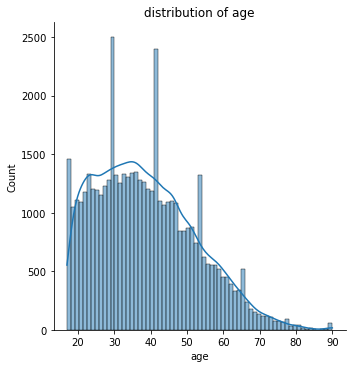

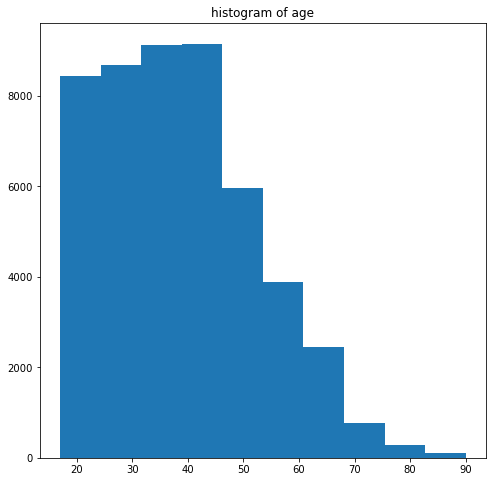

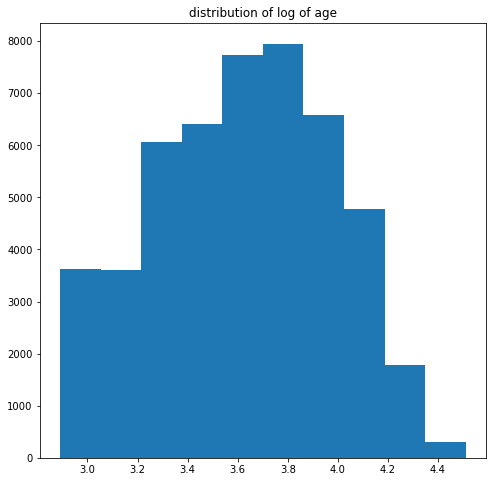

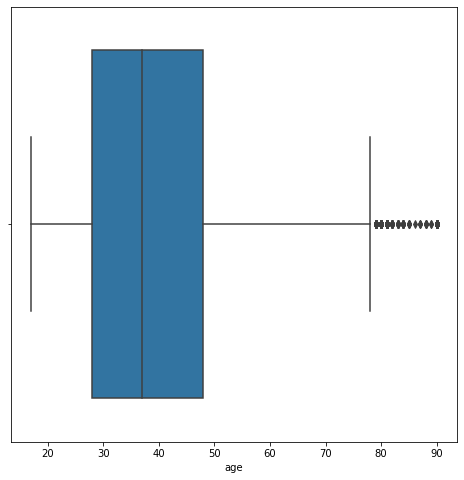

In [24]:
k_de('age',True)
hist('age')
logNorm('age')
boxplot1('age')

<b>Conclusion:

age distribution is not a normal distribution .
    
there exists few outliers



<Figure size 576x576 with 0 Axes>

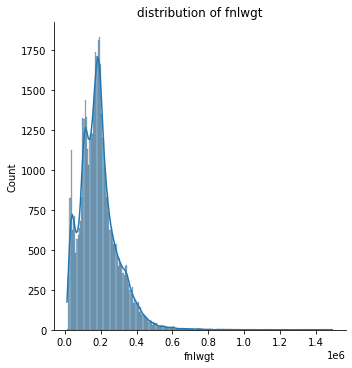

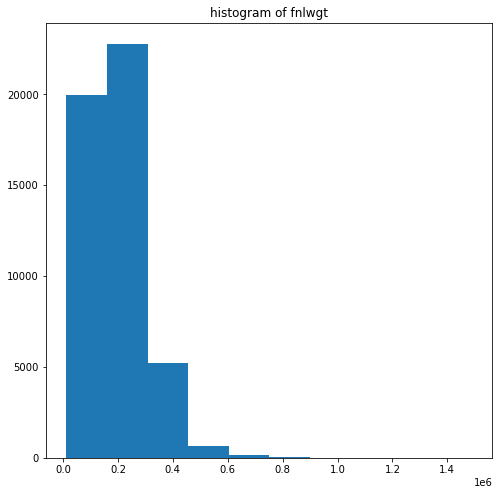

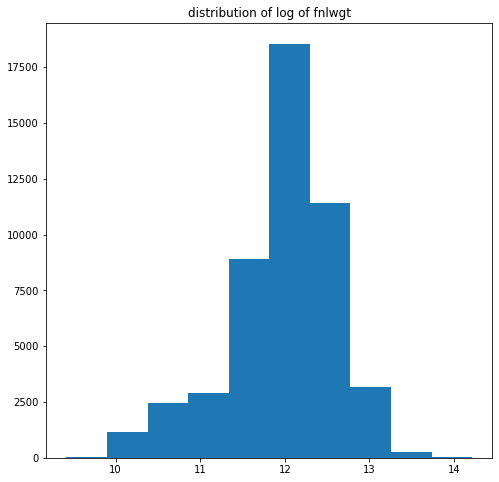

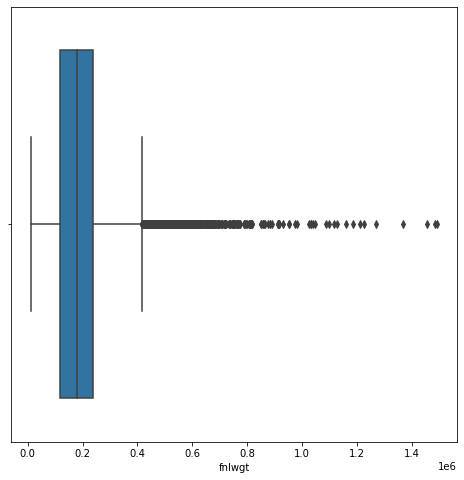

In [25]:
k_de('fnlwgt',True)
hist('fnlwgt')
logNorm('fnlwgt')
boxplot1('fnlwgt')

<b>Conclusion:

fnlwgt distribution is not a normal distribution .
    
there exists many outliers



<Figure size 576x576 with 0 Axes>

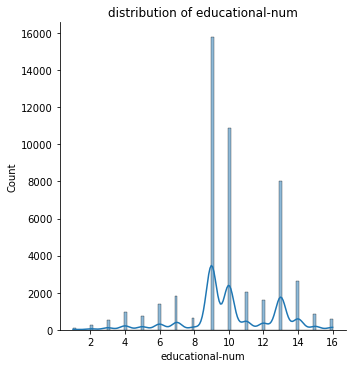

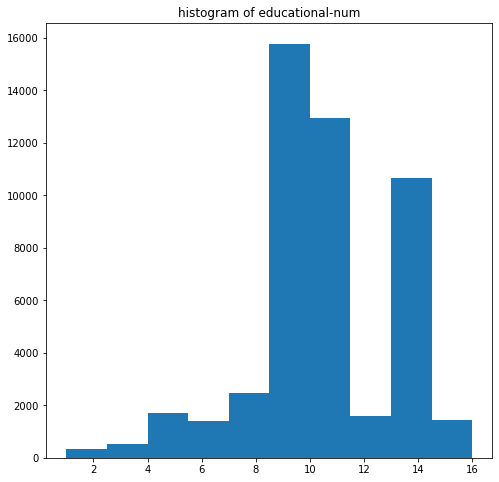

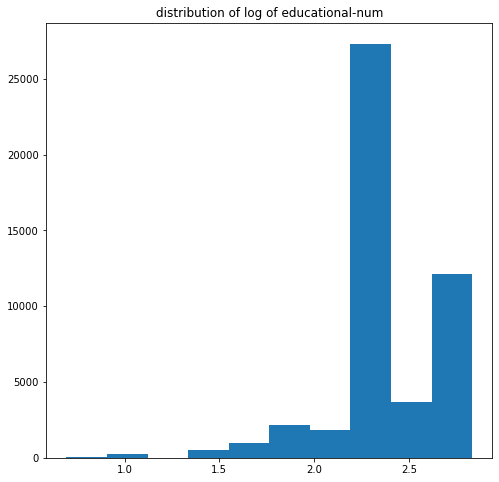

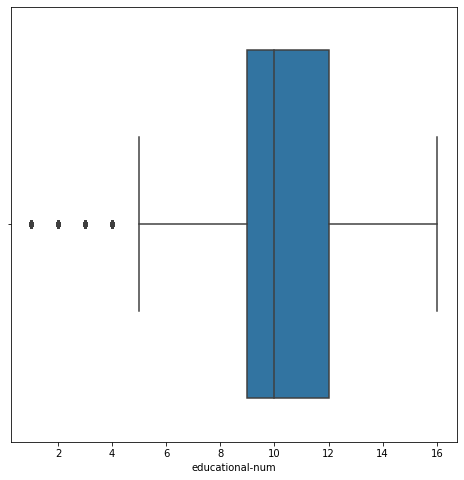

In [26]:
k_de('educational-num',True)
hist('educational-num')
logNorm('educational-num')
boxplot1('educational-num')

<b>Conclusion:

educational-num distribution is not a normal distribution .

There exists few outliers 
    

<Figure size 576x576 with 0 Axes>

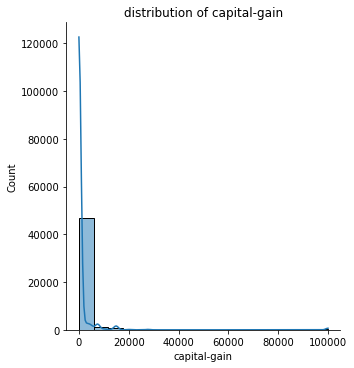

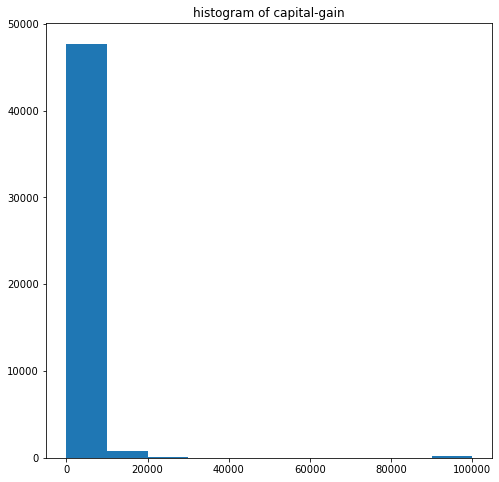

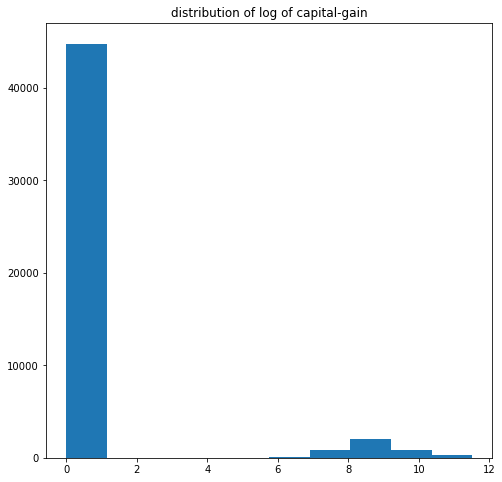

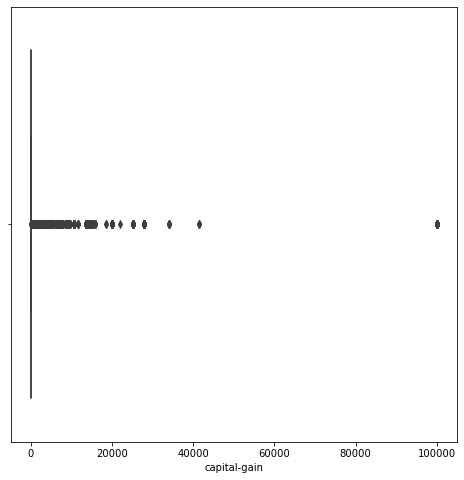

In [27]:
k_de('capital-gain',True)
hist('capital-gain')
logNorm('capital-gain')
boxplot1('capital-gain')

<b>
conclusion
   
capital-gain distribution is not a normal distribution
    
there exists many outliers

<Figure size 576x576 with 0 Axes>

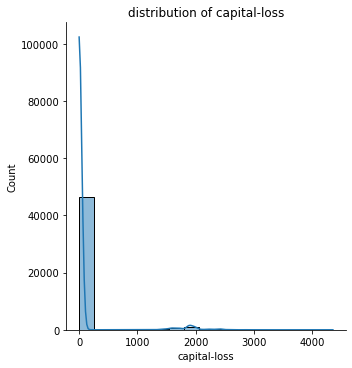

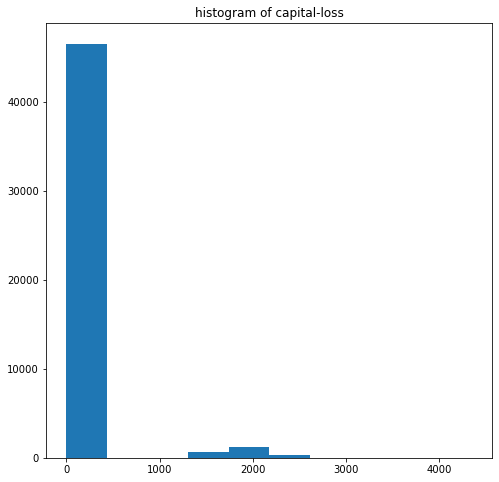

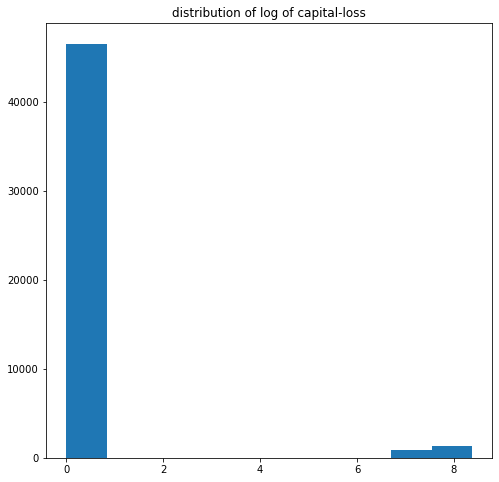

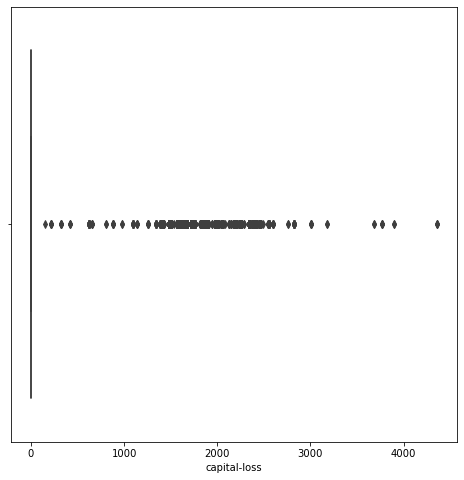

In [28]:
k_de('capital-loss',True)
hist('capital-loss')
logNorm('capital-loss')
boxplot1('capital-loss')

<b>
conclusion:
    
capital-loss distribution is not a normal distribution 

there exists many outliers    

<Figure size 576x576 with 0 Axes>

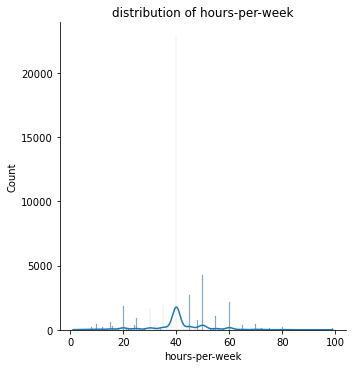

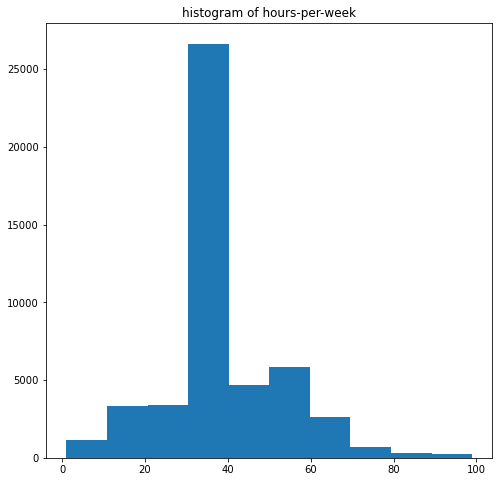

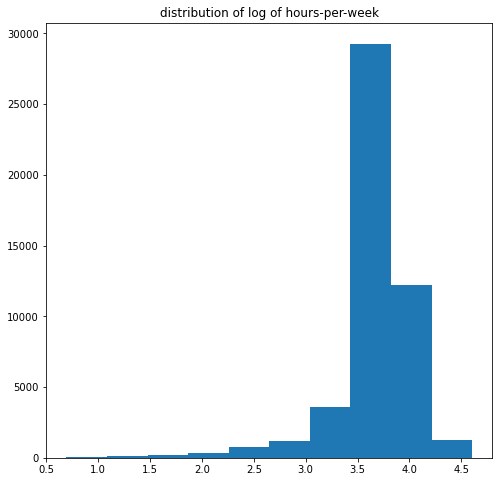

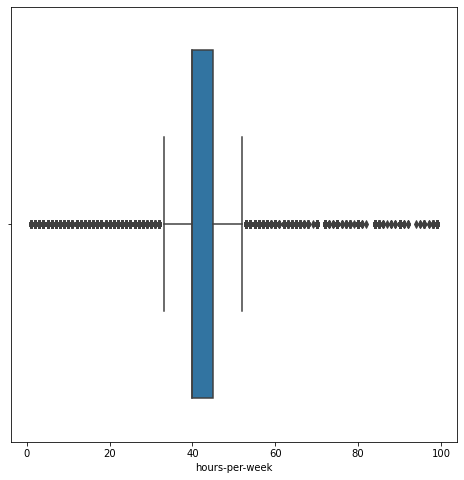

In [29]:
k_de('hours-per-week',True)
hist('hours-per-week')
logNorm('hours-per-week')
boxplot1('hours-per-week')


<b>
conclusion:
    
hours-per-week distribution is not a normal distribution
    
there exists many outliers    


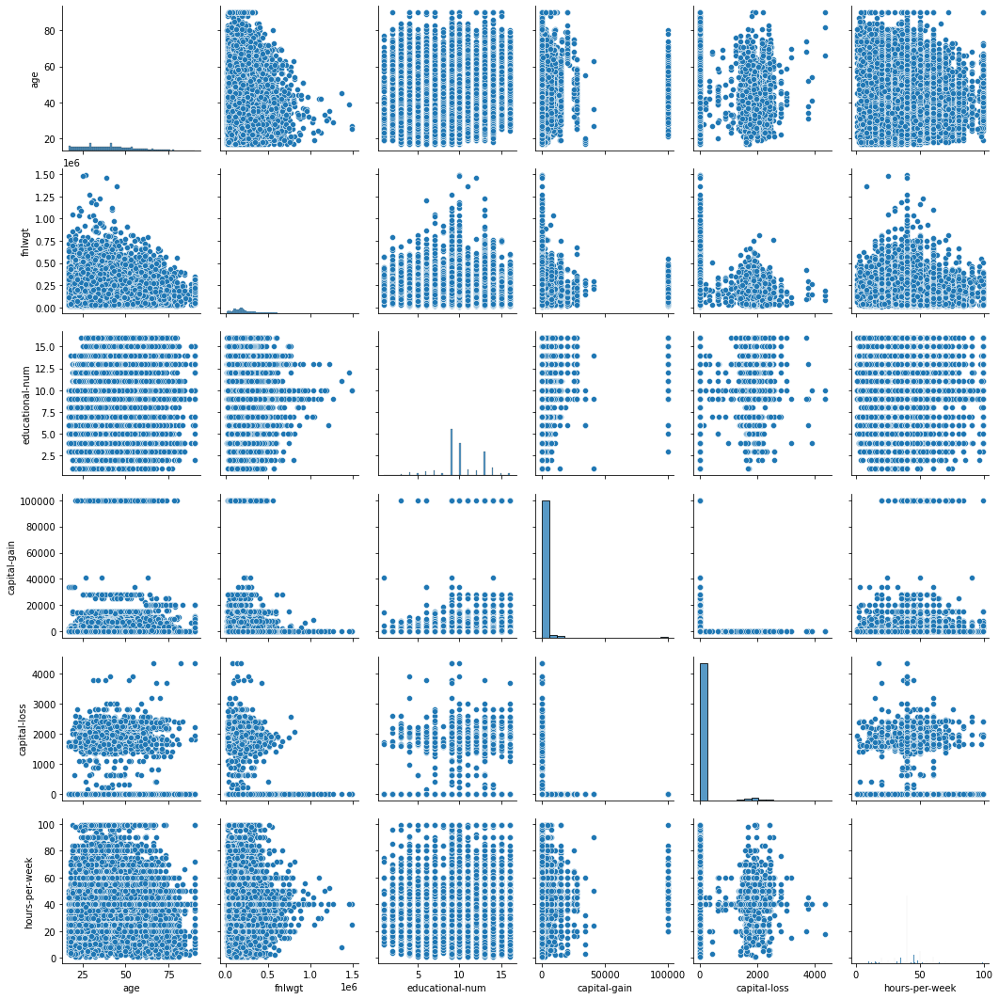

In [30]:
sns.pairplot(data[numerical_col])

In [31]:
px.histogram(data, x='gender')

In [32]:
m_count = data['gender'].value_counts()[:38]
count = pd.DataFrame({'gender':m_count.index, 'Number of adults':m_count.values})
fig=px.pie(count, values='Number of adults', names='gender')
fig.show()

<b>
conclusion:
    
there exist many adults of gender male    

In [33]:
px.histogram(data, x='marital-status',color='gender',barmode='group')

<b> Conclusion :
    
    
many adults(male) are of marital-status : Married-civ-spouse
    
many adults(female) are of marital-status : Never-married


In [34]:
m_count = data['marital-status'].value_counts()[:38]
count = pd.DataFrame({'marital-status':m_count.index, 'Number of adults':m_count.values})
fig=px.pie(count, values='Number of adults', names='marital-status')
fig.show()

In [35]:
px.histogram(data, x='income',color='gender',barmode='group')

In [36]:
m_count = data['income'].value_counts()[:38]
count = pd.DataFrame({'income':m_count.index, 'Number of adults':m_count.values})
fig=px.pie(count, values='Number of adults', names='income')
fig.show()

<b>
conclusion:
    
    Many male adults have income >50k
    
    Max adults have income <=50k

In [37]:
px.histogram(data, x='occupation',color='gender',barmode='group')

In [38]:
m_count = data['occupation'].value_counts()[:38]
count = pd.DataFrame({'occupation':m_count.index, 'Number of adults':m_count.values})
fig=px.pie(count, values='Number of adults', names='occupation')
fig.show()

<b>
    conclusion:
    
    many adults have occupation Prof-specialty
    
    2809 adults' occupation is not available

In [39]:
px.histogram(data, x='workclass',color='gender',barmode='group')

In [40]:
m_count = data['workclass'].value_counts()[:38]
count = pd.DataFrame({'workclass':m_count.index, 'Number of adults':m_count.values})
fig=px.pie(count, values='Number of adults', names='workclass')
fig.show()

<b>
    conclusion:
    
    Majority of adults work in private sector
    
    2799 adults' workclass is not available

In [41]:
px.histogram(data, x='race',color='gender',barmode='group')

In [42]:
m_count = data['race'].value_counts()[:38]
count = pd.DataFrame({'race':m_count.index, 'Number of adults':m_count.values})
fig=px.pie(count, values='Number of adults', names='race')
fig.show()

<b>
    conclusion:
    
    majority of adults in the dataset are whites
    
    406 adults are of different/other races

In [43]:
px.histogram(data, x='native-country',color='gender',barmode='group')

<b>
    conclusion:
    
    majority of adults are from United-States 

In [44]:
px.histogram(data, x='education',color='gender',barmode='group')

In [45]:
m_count = data['education'].value_counts()[:38]
count = pd.DataFrame({'education':m_count.index, 'Number of adults':m_count.values})
fig=px.pie(count, values='Number of adults', names='education')
fig.show()

<b>
    conclusion:
    
    Majority of the adults are high school graduates
    
    

In [46]:
px.histogram(data, x='relationship',color='gender',barmode='group')

In [47]:
m_count = data['relationship'].value_counts()[:38]
count = pd.DataFrame({'relationship':m_count.index, 'Number of adults':m_count.values})
fig=px.pie(count, values='Number of adults', names='relationship')
fig.show()

<b>
    conclusion:
    
    majority of adults of relationship type husband

In [48]:
numerical_col

Index(['age', 'fnlwgt', 'educational-num', 'capital-gain', 'capital-loss',
       'hours-per-week'],
      dtype='object')

### BIVARIATE ANALYSIS

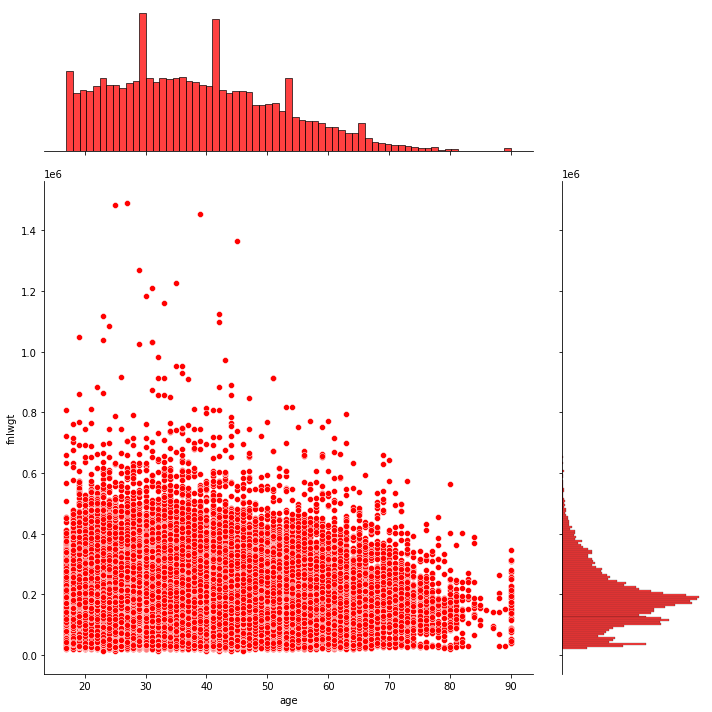

In [49]:
sns.jointplot(x="age", y="fnlwgt",  data=data, height=10, ratio=3, color="red")
plt.show()

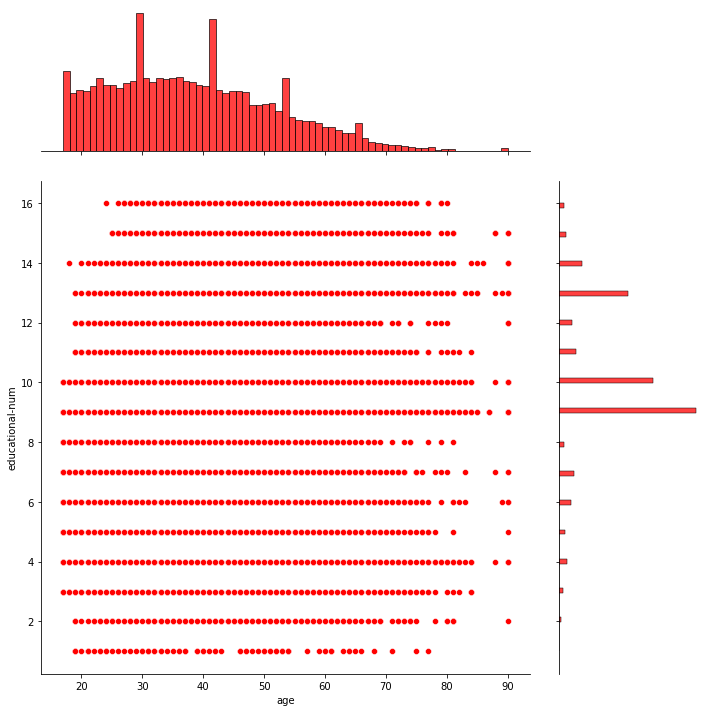

In [50]:
sns.jointplot(x="age", y="educational-num",  data=data, height=10, ratio=3, color="red")
plt.show()

In [51]:
pdata = data[data['hours-per-week'] < data['hours-per-week'].quantile(0.99)]
pdata = data[data['age'] < data['age'].quantile(0.99)]


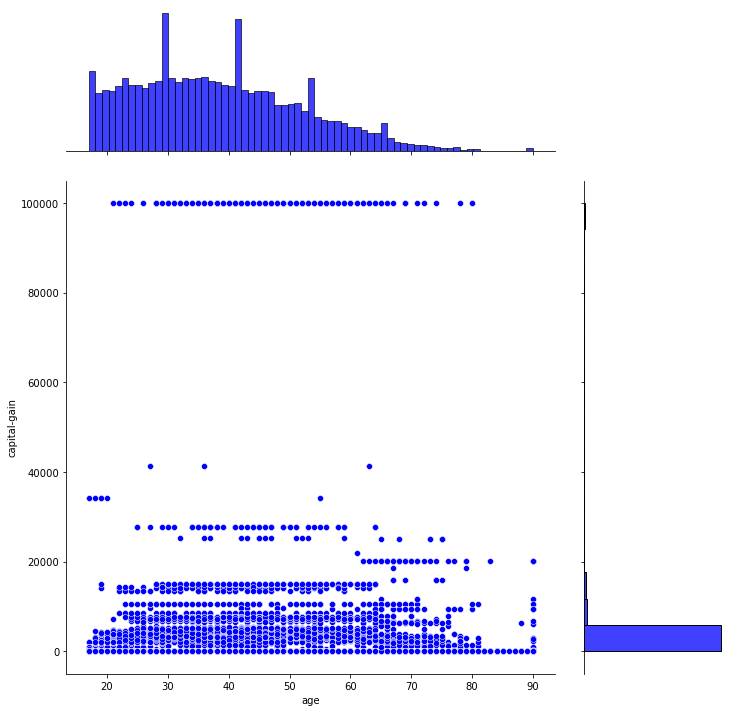

In [52]:
#pdata = data[data['capital-gain'] < data['capital-gain'].quantile(0.99)]
sns.jointplot(x="age", y="capital-gain", data=data, height=10, ratio=3, color="blue")
plt.show()

<b>
Conclusion:
    
Having many healing items may result in higher winning percentage       

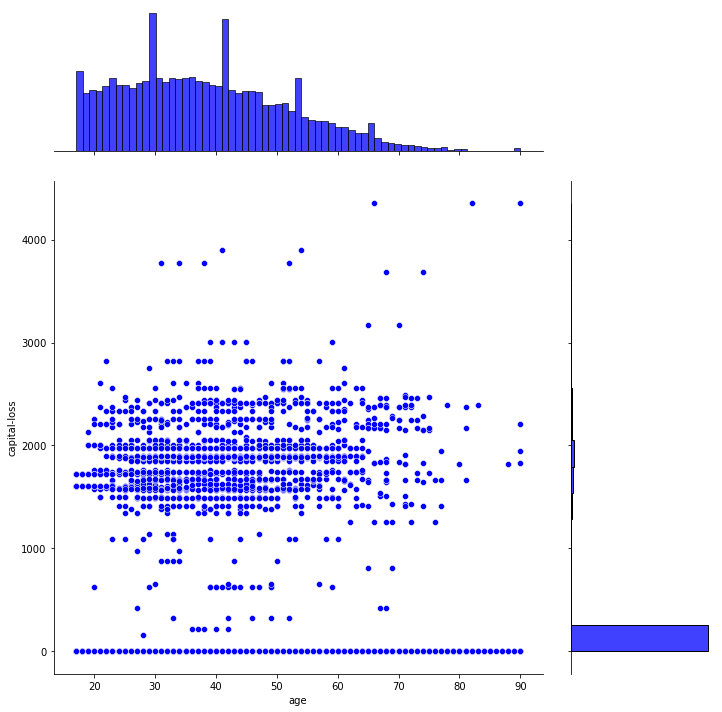

In [53]:
pdata = data[data['capital-loss'] < data['capital-loss'].quantile(0.99)]
sns.jointplot(x="age", y="capital-loss", data=data, height=10, ratio=3, color="blue")
plt.show()

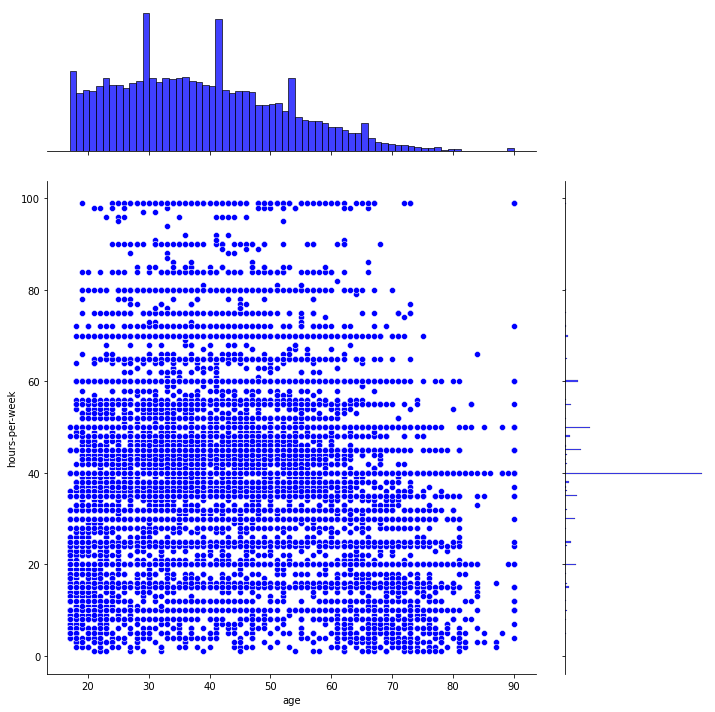

In [54]:
pdata = data[data['hours-per-week'] < data['hours-per-week'].quantile(0.99)]
sns.jointplot(x="age", y="hours-per-week", data=data, height=10, ratio=3, color="blue")
plt.show()

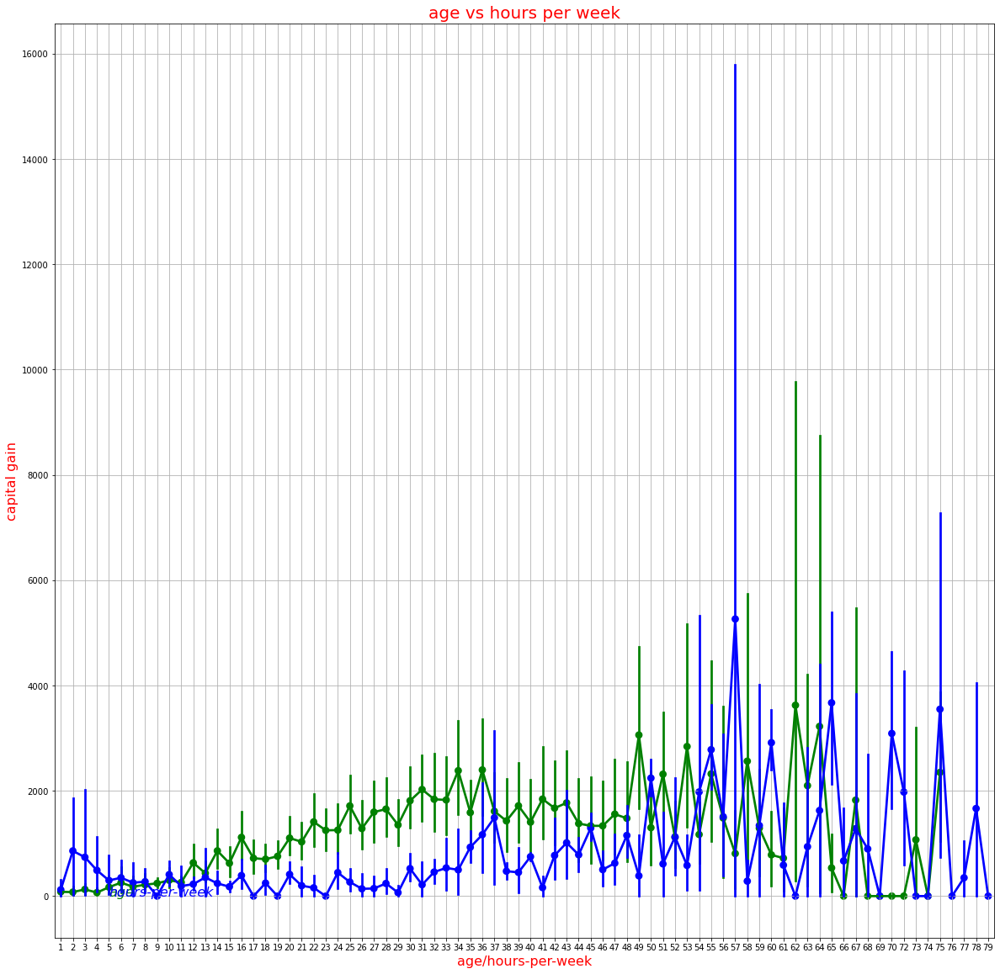

In [55]:
f,ax1 = plt.subplots(figsize =(20,20))
sns.pointplot(x='age',y='capital-gain',data=pdata,color='green',alpha=0.8)
sns.pointplot(x='hours-per-week',y='capital-gain',data=pdata,color='blue',alpha=0.8)
plt.text(4,0.45,'age',color='green',fontsize = 16,style = 'italic')
plt.text(4,0.40,'hours-per-week',color='blue',fontsize = 16,style = 'italic')
plt.xlabel('age/hours-per-week',fontsize = 16,color='red')
plt.ylabel('capital gain',fontsize = 16,color='red')
plt.title('age vs hours per week',fontsize = 20,color='red')
plt.grid()
plt.show()

<b>
Conclusion:
    
1)with increase in age from 13-36 there is a positive tread ie, significant increase in capital-gain
    
2)increase in hours-per-week does not have a constant effect on capital-gain
    


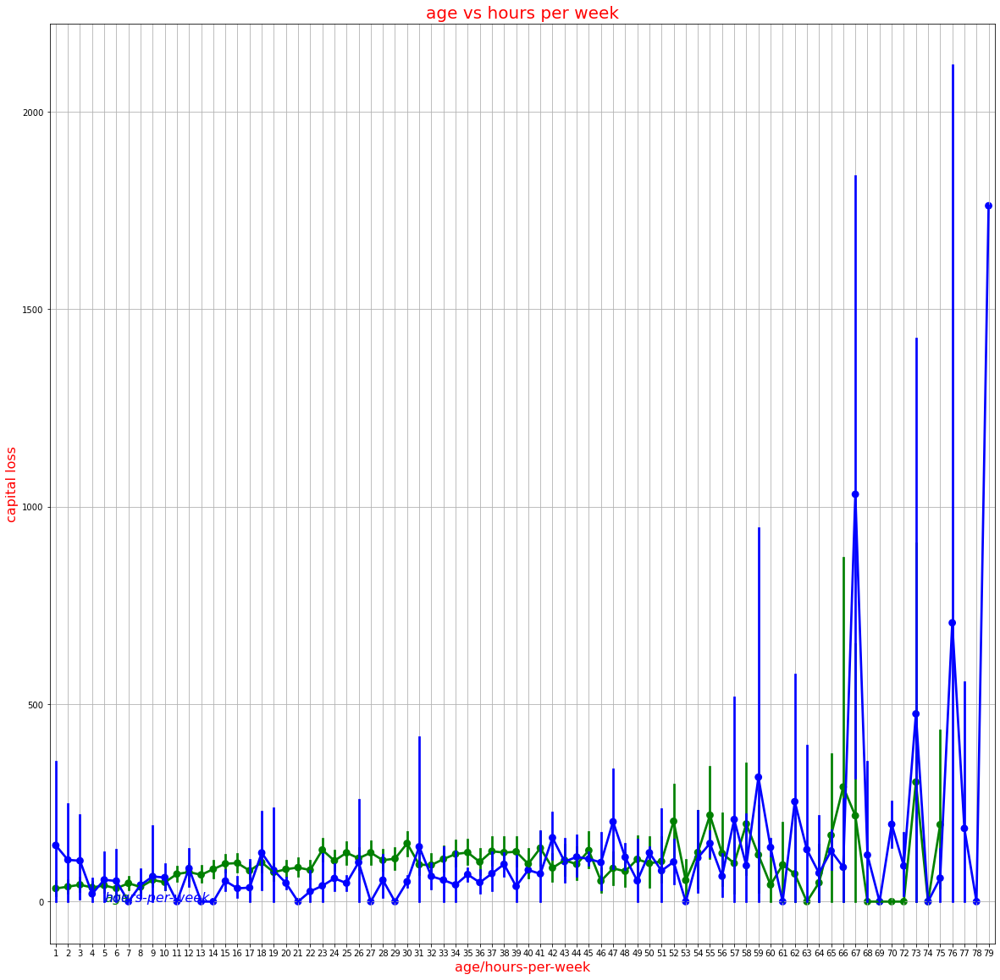

In [56]:
f,ax1 = plt.subplots(figsize =(20,20))
sns.pointplot(x='age',y='capital-loss',data=pdata,color='green',alpha=0.8)
sns.pointplot(x='hours-per-week',y='capital-loss',data=pdata,color='blue',alpha=0.8)
plt.text(4,0.45,'age',color='green',fontsize = 16,style = 'italic')
plt.text(4,0.40,'hours-per-week',color='blue',fontsize = 16,style = 'italic')
plt.xlabel('age/hours-per-week',fontsize = 16,color='red')
plt.ylabel('capital loss',fontsize = 16,color='red')
plt.title('age vs hours per week',fontsize = 20,color='red')
plt.grid()
plt.show()

<b>
Conclusion:
    
1)with increase in age there is a slight positive tread ie, significant increase in capital-loss
    
2)increase in hours-per-week does not have a constant effect on capital-loss
    


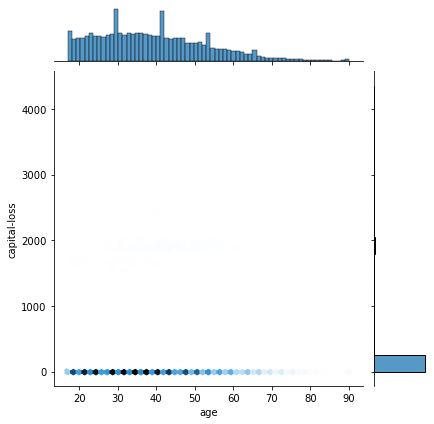

In [57]:
sns.jointplot(data=data,x='age',y='capital-loss',kind='hex')

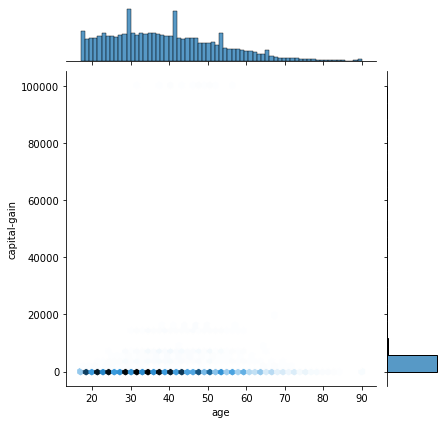

In [58]:
sns.jointplot(data=data,x='age',y='capital-gain',kind='hex')

### CORRELATION

Text(0.5, 1.0, 'Multi-Collinearity of Attributes')

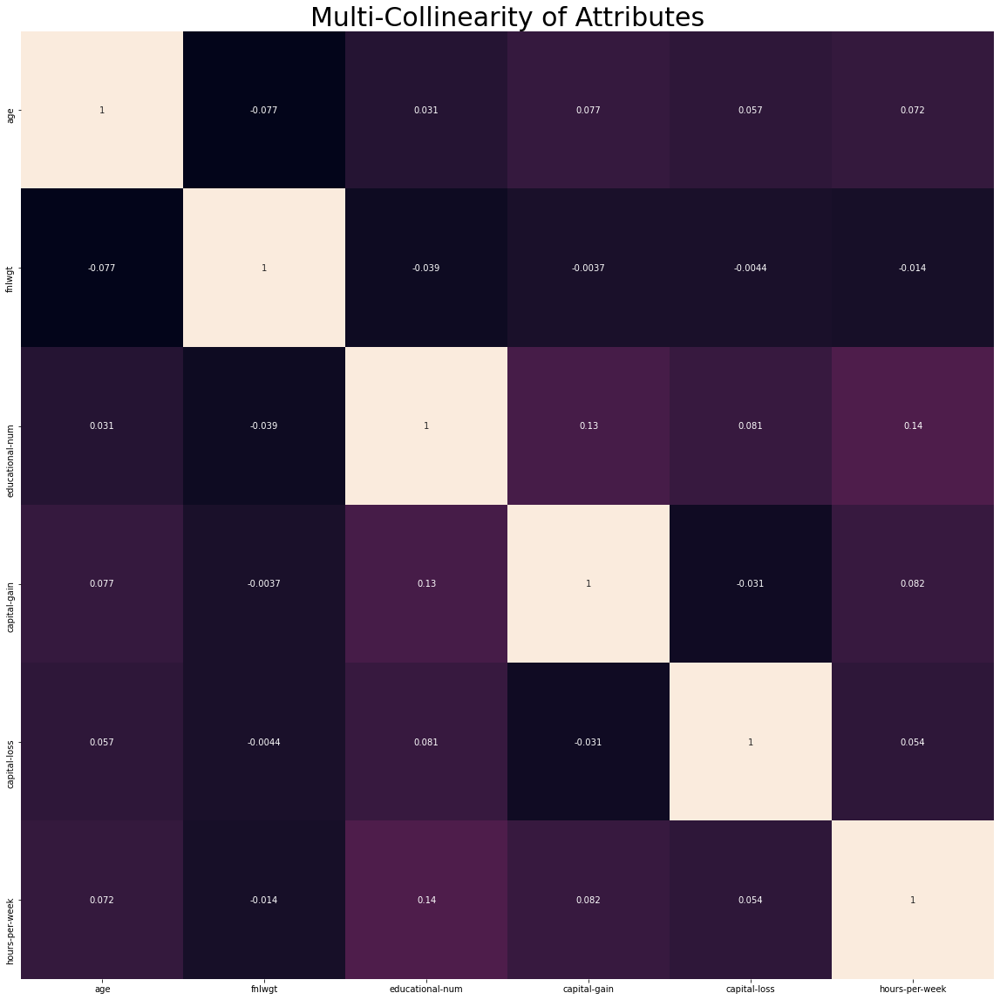

In [59]:
fig, ax = plt.subplots(figsize=(20,20))
sns.heatmap(numericdata.corr(),annot=True, cbar=False ,ax=ax)
ax.set_title('Multi-Collinearity of Attributes', fontsize=30)

# Outliers and Missing Data

# OUTLIERS

### Boxplot for Numerical columns

In [60]:
df=data[numerical_col]

#### BOXPLOT BEFORE REMOVING OUTLIERS

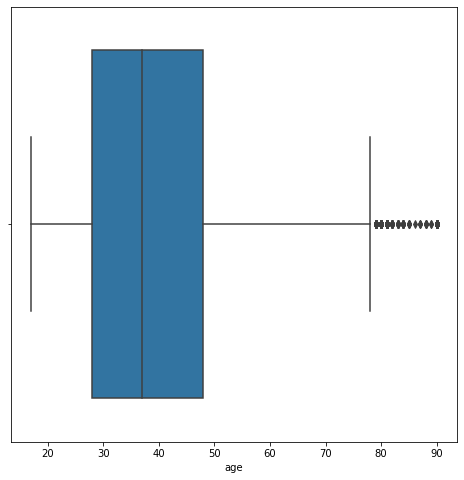

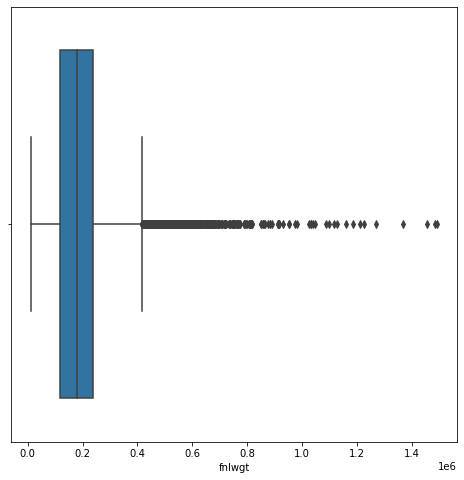

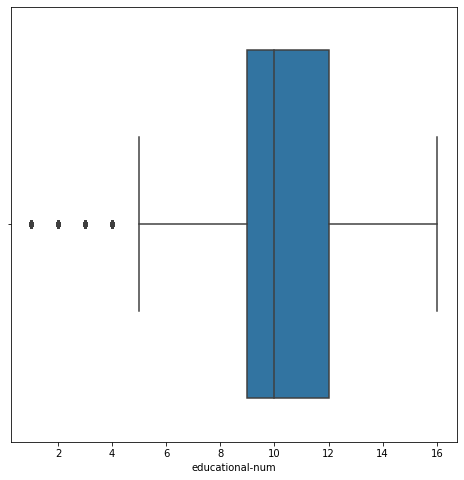

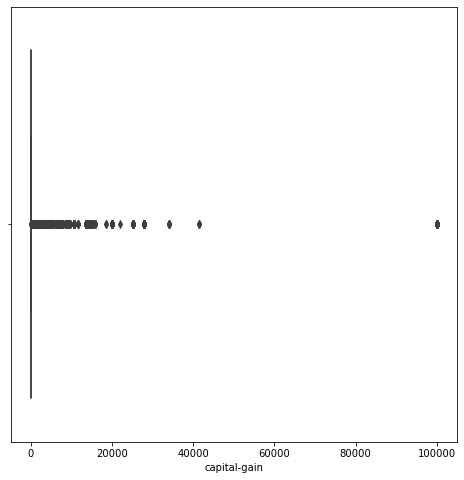

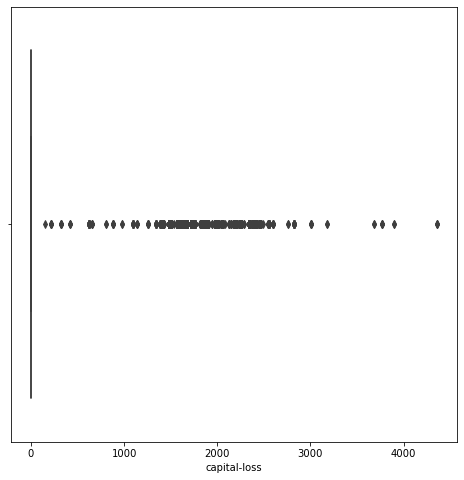

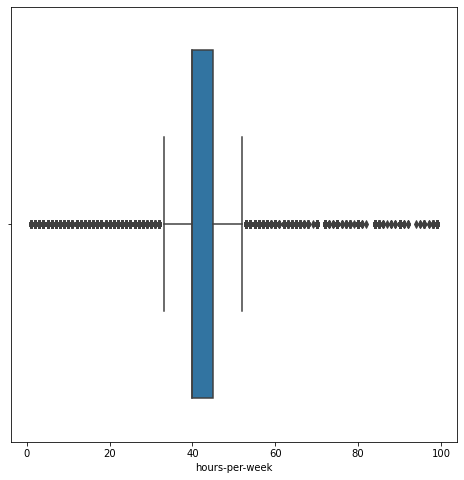

In [61]:
for x in numerical_col:
    boxplot1(x)

#### Z-Score Method

Using Z score method,we can find out how many standard deviations value away from the mean.


In [62]:
out=[]
def Zscore_outlier(x):
    m = np.mean(df[x])
    sd = np.std(df[x])
    for i in df[x]: 
        z = (i-m)/sd
        if np.abs(z) > 3: 
            out.append(i)
    print("\nOutliers for {}  \n{}".format(x,out))
    print("\n Number of outliers in {} are {}".format(x,len(out)))

In [63]:
for x in numerical_col:
    Zscore_outlier(x)



Outliers for age  
[80, 90, 80, 81, 82, 83, 81, 85, 80, 90, 81, 84, 81, 89, 81, 83, 81, 82, 80, 90, 81, 83, 80, 90, 90, 84, 80, 80, 80, 81, 90, 85, 90, 81, 81, 80, 80, 81, 80, 88, 87, 90, 83, 80, 90, 81, 81, 90, 82, 90, 87, 81, 88, 80, 81, 80, 81, 90, 88, 89, 84, 80, 80, 83, 81, 90, 80, 81, 90, 88, 90, 90, 80, 90, 81, 82, 81, 80, 83, 90, 90, 81, 90, 90, 80, 90, 90, 84, 90, 80, 90, 81, 83, 84, 81, 85, 82, 80, 90, 90, 90, 84, 80, 90, 90, 84, 90, 90, 90, 90, 82, 81, 90, 84, 81, 82, 81, 80, 90, 80, 84, 82, 90, 84, 90, 83, 81, 80, 80, 80, 90, 90, 80, 90, 90, 81, 83, 82, 90, 90, 81, 80, 80, 90, 80, 82, 85, 80, 90, 81, 80, 81, 82, 88, 90, 82, 88, 84, 83, 86, 90, 90, 82, 83, 81, 90, 80, 81, 84, 84, 90, 80, 81, 81, 81, 90, 87, 90, 80, 80, 82, 90, 90, 85, 82, 81]

 Number of outliers in age are 186

Outliers for fnlwgt  
[80, 90, 80, 81, 82, 83, 81, 85, 80, 90, 81, 84, 81, 89, 81, 83, 81, 82, 80, 90, 81, 83, 80, 90, 90, 84, 80, 80, 80, 81, 90, 85, 90, 81, 81, 80, 80, 81, 80, 88, 87, 90, 83, 80,


Outliers for hours-per-week  
[80, 90, 80, 81, 82, 83, 81, 85, 80, 90, 81, 84, 81, 89, 81, 83, 81, 82, 80, 90, 81, 83, 80, 90, 90, 84, 80, 80, 80, 81, 90, 85, 90, 81, 81, 80, 80, 81, 80, 88, 87, 90, 83, 80, 90, 81, 81, 90, 82, 90, 87, 81, 88, 80, 81, 80, 81, 90, 88, 89, 84, 80, 80, 83, 81, 90, 80, 81, 90, 88, 90, 90, 80, 90, 81, 82, 81, 80, 83, 90, 90, 81, 90, 90, 80, 90, 90, 84, 90, 80, 90, 81, 83, 84, 81, 85, 82, 80, 90, 90, 90, 84, 80, 90, 90, 84, 90, 90, 90, 90, 82, 81, 90, 84, 81, 82, 81, 80, 90, 80, 84, 82, 90, 84, 90, 83, 81, 80, 80, 80, 90, 90, 80, 90, 90, 81, 83, 82, 90, 90, 81, 80, 80, 90, 80, 82, 85, 80, 90, 81, 80, 81, 82, 88, 90, 82, 88, 84, 83, 86, 90, 90, 82, 83, 81, 90, 80, 81, 84, 84, 90, 80, 81, 81, 81, 90, 87, 90, 80, 80, 82, 90, 90, 85, 82, 81, 537222, 513100, 512864, 599057, 542610, 652784, 573446, 662460, 629900, 509364, 632733, 560313, 651702, 644278, 535852, 522241, 581128, 608881, 914061, 624006, 510072, 593246, 714597, 816750, 552529, 575172, 622192, 566066, 

#### BOXPLOT AFTER REMOVING OUTLIERS

In [64]:
df=df[(np.abs(stats.zscore(df)) < 3).all(axis=1)]

In [65]:
len(df)

44717

In [66]:
print("number of records with outliers",len(data)-len(df))

number of records with outliers 4125


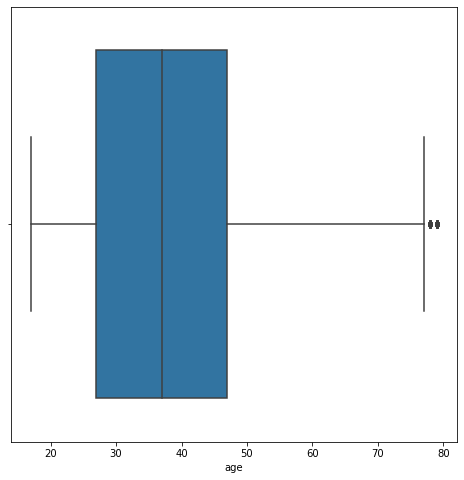

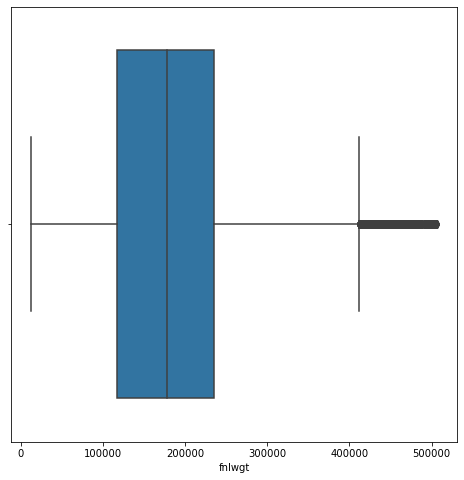

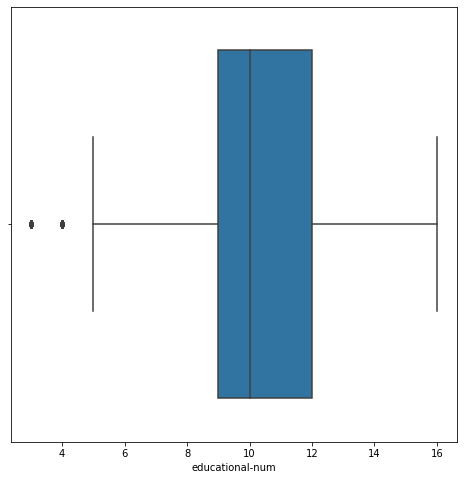

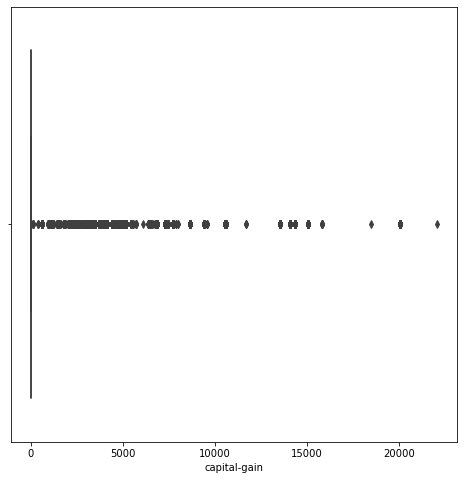

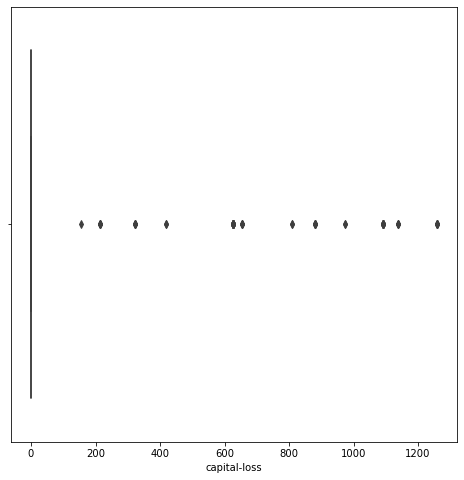

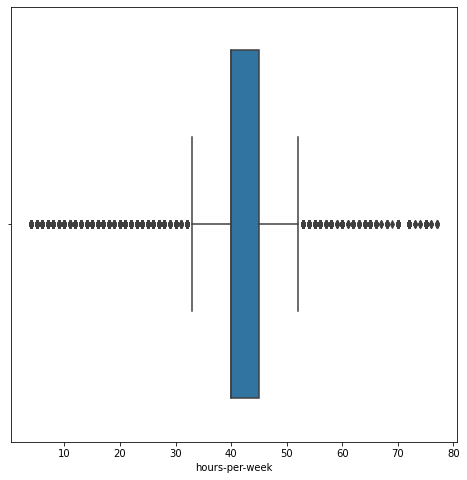

In [67]:
for x in numerical_col:
    fig=plt.figure(figsize=(8,8))    
    sns.boxplot(x=x,data=df)


### Checking for NULL values

In [68]:
for x in data.columns:
    print("null values in {} are {}".format(x,len(data[pd.isnull(data[x])])))


null values in age are 0
null values in workclass are 0
null values in fnlwgt are 0
null values in education are 0
null values in educational-num are 0
null values in marital-status are 0
null values in occupation are 0
null values in relationship are 0
null values in race are 0
null values in gender are 0
null values in capital-gain are 0
null values in capital-loss are 0
null values in hours-per-week are 0
null values in native-country are 0
null values in income are 0


## Checking Missing values

In [69]:
numerical_col

Index(['age', 'fnlwgt', 'educational-num', 'capital-gain', 'capital-loss',
       'hours-per-week'],
      dtype='object')

In [70]:
data['age'].unique()

array([25, 38, 28, 44, 18, 34, 29, 63, 24, 55, 65, 36, 26, 58, 48, 43, 20,
       37, 40, 72, 45, 22, 23, 54, 32, 46, 56, 17, 39, 52, 21, 42, 33, 30,
       47, 41, 19, 69, 50, 31, 59, 49, 51, 27, 57, 61, 64, 79, 73, 53, 77,
       80, 62, 35, 68, 66, 75, 60, 67, 71, 70, 90, 81, 74, 78, 82, 83, 85,
       76, 84, 89, 88, 87, 86], dtype=int64)

In [71]:
data['capital-gain'].unique()

array([    0,  7688,  3103,  6418,  7298,  3908, 14084,  5178, 15024,
       99999,  2597,  2907,  4650,  6497,  1055,  5013, 27828,  4934,
        4064,  3674,  2174, 10605,  3418,   114,  2580,  3411,  4508,
        4386,  8614, 13550,  6849,  2463,  3137,  2885,  2964,  1471,
       10566,  2354,  1424,  1455,  3325,  4416, 25236,   594,  2105,
        4787,  2829,   401,  4865,  1264,  1506, 10520,  3464,  2653,
       20051,  4101,  1797,  2407,  3471,  1086,  1848, 14344,  1151,
        2993,  2290, 15020,  9386,  2202,  3818,  2176,  5455, 11678,
        7978,  7262,  6514, 41310,  3456,  7430,  2414,  2062, 34095,
        1831,  6723,  5060, 15831,  2977,  2346,  3273,  2329,  9562,
        2635,  4931,  1731,  6097,   914,  7896,  5556,  1409,  3781,
        3942,  2538,  3887, 25124,  7443,  5721,  1173,  4687,  6612,
        6767,  2961,   991,  2036,  2936,  2050,  1111,  2228, 22040,
        3432,  6360,  2009,  1639, 18481,  2387], dtype=int64)

In [72]:
data['capital-loss'].unique()

array([   0, 1721, 1876, 2415, 1887,  625, 1977, 2057, 1429, 1590, 1485,
       2051, 2377, 1672, 1628, 1902, 1602, 1741, 2444, 1408, 2001, 2042,
       1740, 1825, 1848, 1719, 3004, 2179, 1573, 2205, 1258, 2339, 1726,
       2258, 1340, 1504, 2559, 1668, 1974, 1980, 1564, 2547, 2002, 1669,
       1617,  323, 3175, 2472, 2174, 1579, 2129, 1510, 1735, 2282, 1870,
       1411, 1911, 1651, 1092, 1762, 2457, 2231, 2238,  653, 1138, 2246,
       2603, 2392, 1944, 1380, 2465, 1421, 3770, 1594,  213, 2149, 2824,
       1844, 2467, 2163, 1816, 1648, 2206, 2352,  419, 1539,  880,  810,
        974, 4356, 2489, 1755, 3683, 2267, 2080,  155, 3900, 2201, 2754],
      dtype=int64)

In [73]:
data['hours-per-week'].unique()

array([40, 50, 30, 32, 10, 39, 35, 48, 25, 20, 45, 47,  6, 43, 90, 54, 60,
       38, 36, 18, 24, 44, 56, 28, 16, 41, 22, 55, 14, 33, 37,  8, 12, 70,
       15, 75, 52, 84, 42, 80, 68, 99, 65,  5, 17, 72, 53, 29, 96, 21, 46,
        3,  1, 23, 49, 67, 76,  7,  2, 58, 26, 34,  4, 51, 78, 63, 31, 92,
       77, 27, 85, 13, 19, 98, 62, 66, 57, 11, 86, 59,  9, 64, 73, 61, 88,
       79, 89, 74, 69, 87, 97, 94, 82, 91, 81, 95], dtype=int64)

In [74]:
data['fnlwgt'].unique()

array([226802,  89814, 336951, ..., 129912, 255835, 257302], dtype=int64)

In [75]:
data['educational-num'].unique()

array([ 7,  9, 12, 10,  6, 15,  4, 13, 14, 16,  3, 11,  5,  8,  2,  1],
      dtype=int64)

<b>Conclusion
    
    no missing values in numerical columns

In [76]:
categorical_col

['workclass',
 'relationship',
 'race',
 'gender',
 'occupation',
 'education',
 'native-country',
 'marital-status',
 'income']

In [77]:
for x in categorical_col:
    print(" {} -{}\n".format(x,data[x].unique()))

 workclass -['Private' 'Local-gov' '?' 'Self-emp-not-inc' 'Federal-gov' 'State-gov'
 'Self-emp-inc' 'Without-pay' 'Never-worked']

 relationship -['Own-child' 'Husband' 'Not-in-family' 'Unmarried' 'Wife' 'Other-relative']

 race -['Black' 'White' 'Asian-Pac-Islander' 'Other' 'Amer-Indian-Eskimo']

 gender -['Male' 'Female']

 occupation -['Machine-op-inspct' 'Farming-fishing' 'Protective-serv' '?'
 'Other-service' 'Prof-specialty' 'Craft-repair' 'Adm-clerical'
 'Exec-managerial' 'Tech-support' 'Sales' 'Priv-house-serv'
 'Transport-moving' 'Handlers-cleaners' 'Armed-Forces']

 education -['11th' 'HS-grad' 'Assoc-acdm' 'Some-college' '10th' 'Prof-school'
 '7th-8th' 'Bachelors' 'Masters' 'Doctorate' '5th-6th' 'Assoc-voc' '9th'
 '12th' '1st-4th' 'Preschool']

 native-country -['United-States' '?' 'Peru' 'Guatemala' 'Mexico' 'Dominican-Republic'
 'Ireland' 'Germany' 'Philippines' 'Thailand' 'Haiti' 'El-Salvador'
 'Puerto-Rico' 'Vietnam' 'South' 'Columbia' 'Japan' 'India' 'Cambodia'
 'Poland

<b> Conclusion:
    
    missing values in columns -  occupation , native-country and workclass

# MEDIAN and MEAN IMPUTATION 

In [78]:
traindata=data.copy()

In [79]:
traindata.head(3)

,age,workclass,fnlwgt,education,educational-num,marital-status,occupation,relationship,race,gender,capital-gain,capital-loss,hours-per-week,native-country,income
0,25,Private,226802,11th,7,Never-married,Machine-op-inspct,Own-child,Black,Male,0,0,40,United-States,<=50K
1,38,Private,89814,HS-grad,9,Married-civ-spouse,Farming-fishing,Husband,White,Male,0,0,50,United-States,<=50K
2,28,Local-gov,336951,Assoc-acdm,12,Married-civ-spouse,Protective-serv,Husband,White,Male,0,0,40,United-States,>50K


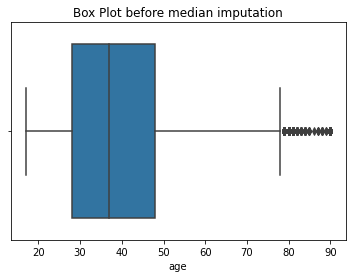

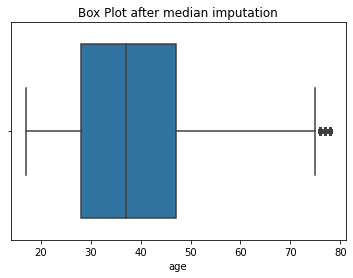

In [80]:
sns.boxplot(x='age',data=traindata)
plt.title("Box Plot before median imputation")
plt.show()
q1 = traindata['age'].quantile(0.25)
q3 = traindata['age'].quantile(0.75)
iqr = q3-q1
Lower_tail = q1 - 1.5 * iqr
Upper_tail = q3 + 1.5 * iqr
med = np.median(traindata['age'])
for i in traindata['age']:
    if i > Upper_tail or i < Lower_tail:
            traindata['age'] = traindata['age'].replace(i, med)
sns.boxplot(x='age',data=traindata)
plt.title("Box Plot after median imputation")
plt.show()   

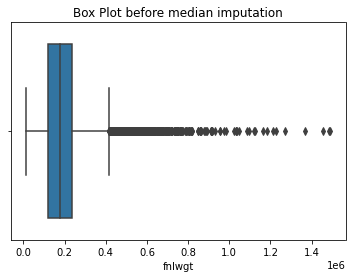

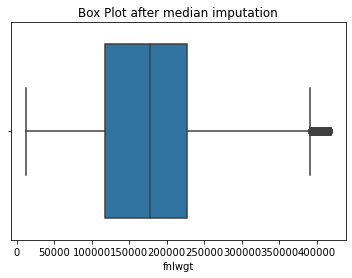

In [81]:
sns.boxplot(x='fnlwgt',data=traindata)
plt.title("Box Plot before median imputation")
plt.show()
q1 = traindata['fnlwgt'].quantile(0.25)
q3 = traindata['fnlwgt'].quantile(0.75)
iqr = q3-q1
Lower_tail = q1 - 1.5 * iqr
Upper_tail = q3 + 1.5 * iqr
med = np.median(traindata['fnlwgt'])
for i in traindata['fnlwgt']:
    if i > Upper_tail or i < Lower_tail:
            traindata['fnlwgt'] = traindata['fnlwgt'].replace(i, med)
sns.boxplot(x='fnlwgt',data=traindata)
plt.title("Box Plot after median imputation")
plt.show()   

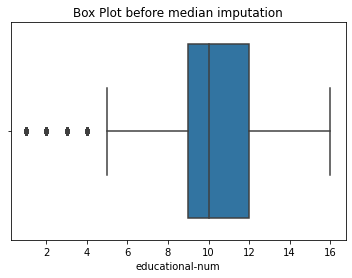

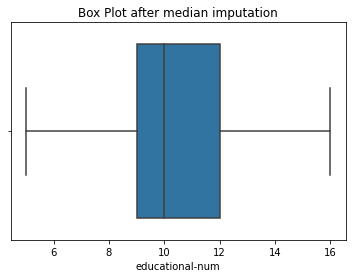

In [82]:
sns.boxplot(x='educational-num',data=traindata)
plt.title("Box Plot before median imputation")
plt.show()
q1 = traindata['educational-num'].quantile(0.25)
q3 = traindata['educational-num'].quantile(0.75)
iqr = q3-q1
Lower_tail = q1 - 1.5 * iqr
Upper_tail = q3 + 1.5 * iqr
med = np.median(traindata['educational-num'])
for i in traindata['educational-num']:
    if i > Upper_tail or i < Lower_tail:
            traindata['educational-num'] = traindata['educational-num'].replace(i, med)
sns.boxplot(x='educational-num',data=traindata)
plt.title("Box Plot after median imputation")
plt.show()   

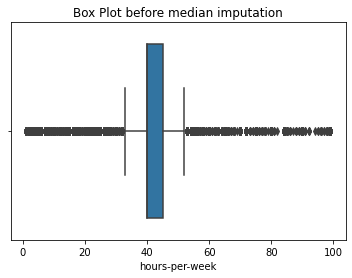

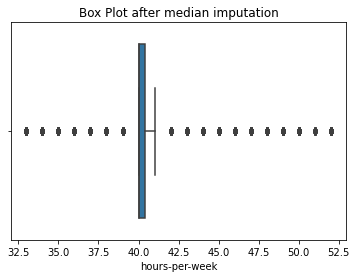

In [83]:
sns.boxplot(x='hours-per-week',data=traindata)
plt.title("Box Plot before median imputation")
plt.show()
q1 = traindata['hours-per-week'].quantile(0.25)
q3 = traindata['hours-per-week'].quantile(0.75)
iqr = q3-q1
Lower_tail = q1 - 1.5 * iqr
Upper_tail = q3 + 1.5 * iqr
m = np.mean(traindata['hours-per-week'])
for i in traindata['hours-per-week']:
    if i > Upper_tail or i < Lower_tail:
            traindata['hours-per-week'] = traindata['hours-per-week'].replace(i, m)
sns.boxplot(x='hours-per-week',data=traindata)
plt.title("Box Plot after median imputation")
plt.show()   

# NORMALIZING DATA

In [84]:
for column in numerical_col:
    if column != 'income':
        traindata[column] = traindata.loc[:, [column]].apply(lambda x: (x - x.min()) / (x.max()- x.min()))

# Re-arrange data

In [85]:
traindata.replace(['Divorced', 'Married-AF-spouse', 'Married-civ-spouse', 'Married-spouse-absent', 'Never-married','Separated','Widowed'],
['not married','married','married','married','not married','not married','not married'], inplace = True)

traindata.replace(['Private', 'Self-emp-not-inc', 'Self-emp-inc', 'Federal-gov', 'Local-gov','State-gov','Without-pay', 'Never-worked'],
['Private','inc','inc','gov','gov','gov','Without-pay','Never-worked'], inplace = True)

traindata.loc[(traindata['income'] == '<=50K'),'income']='0'
traindata.loc[(traindata['income'] == '>50K'),'income']='1'


# Deleting the incomplete data

In [86]:
col_names = traindata.columns
num_data = traindata.shape[0]
for c in col_names:
    num_non = traindata[c].isin(["?"]).sum()
    if num_non > 0:
        print (c) 
        print (num_non) 
        print ("{0:.2f}%".format(float(num_non) / num_data * 100)) 
        print ("\n")
#delete the incomplete data
traindata = traindata[traindata["workclass"] != "?"] 
traindata = traindata[traindata["occupation"] != "?"]
traindata = traindata[traindata["native-country"] != "?"]

workclass
2799
5.73%


occupation
2809
5.75%


native-country
857
1.75%




# LABEL ENCODING

In [87]:
traindata=traindata.apply(preprocessing.LabelEncoder().fit_transform)
traindata

,age,workclass,fnlwgt,education,educational-num,marital-status,occupation,relationship,race,gender,capital-gain,capital-loss,hours-per-week,native-country,income
0,8,0,18120,1,2,1,6,3,2,1,0,0,7,38,0
1,21,0,3913,11,4,0,4,0,4,1,0,0,18,38,0
2,11,2,23771,7,7,0,10,0,4,1,0,0,7,38,1
3,27,0,10474,15,5,0,6,0,2,1,96,0,7,38,1
5,17,0,15398,0,1,1,7,1,4,1,0,0,8,38,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
48837,10,0,20236,7,7,0,12,5,4,0,0,0,5,38,0
48838,23,0,9896,11,4,0,6,0,4,1,0,0,7,38,1
48839,41,0,9650,11,4,1,0,4,4,0,0,0,7,38,0
48840,5,0,15753,11,4,1,0,3,4,1,0,0,8,38,0


# Stratified sampling

In [88]:
high_income = traindata[traindata['income'] == 1]
low_income = traindata[traindata['income'] == 0]
training_data = pd.concat([high_income.sample(frac=0.8, random_state=1),low_income.sample(frac=0.8, random_state=1)])
testing_data=pd.concat([high_income.sample(frac=0.2, random_state=1),low_income.sample(frac=0.2, random_state=1)])

In [89]:
training_data

,age,workclass,fnlwgt,education,educational-num,marital-status,occupation,relationship,race,gender,capital-gain,capital-loss,hours-per-week,native-country,income
29795,21,0,24878,9,8,0,9,0,4,1,0,0,7,38,1
39945,39,0,16132,11,4,0,11,0,4,1,0,0,8,38,1
28296,29,0,13458,12,9,0,9,5,4,0,96,0,2,38,1
43914,15,2,5,7,7,0,10,0,4,1,0,0,8,8,1
28422,29,3,6826,14,10,0,9,0,4,1,120,0,8,38,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4284,44,0,10838,11,4,1,6,1,4,0,0,0,7,38,0
24920,14,0,15595,11,4,1,0,1,4,0,0,0,7,10,0
36946,8,0,7723,11,4,0,6,0,4,1,0,0,7,38,0
17651,9,0,25462,7,7,1,7,3,2,1,0,0,7,38,0


In [90]:
testing_data

,age,workclass,fnlwgt,education,educational-num,marital-status,occupation,relationship,race,gender,capital-gain,capital-loss,hours-per-week,native-country,income
29795,21,0,24878,9,8,0,9,0,4,1,0,0,7,38,1
39945,39,0,16132,11,4,0,11,0,4,1,0,0,8,38,1
28296,29,0,13458,12,9,0,9,5,4,0,96,0,2,38,1
43914,15,2,5,7,7,0,10,0,4,1,0,0,8,8,1
28422,29,3,6826,14,10,0,9,0,4,1,120,0,8,38,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
27317,7,2,15242,11,4,1,12,1,4,0,0,0,7,38,0
40098,14,2,12654,9,8,1,0,1,4,1,0,0,15,38,0
35963,18,0,2495,9,8,1,9,1,4,0,0,0,7,38,0
7302,28,3,368,11,4,0,7,5,4,0,0,0,8,38,0


In [91]:
trainy=training_data['income']
trainx=training_data[['age', 'workclass', 'fnlwgt', 'education', 'educational-num',
       'marital-status', 'occupation', 'relationship', 'race', 'gender',
       'capital-gain', 'capital-loss', 'hours-per-week', 'native-country']]
testy=testing_data['income']
testx=testing_data[['age', 'workclass', 'fnlwgt', 'education', 'educational-num',
       'marital-status', 'occupation', 'relationship', 'race', 'gender',
       'capital-gain', 'capital-loss', 'hours-per-week', 'native-country']]

# MODELS AND RESULTS

### LogisticRegression

In [92]:
from sklearn import linear_model

In [93]:
logisticclassifier=linear_model.LogisticRegression(solver='lbfgs',max_iter=10000)

In [94]:
logisticclassifier.fit(trainx, trainy)

LogisticRegression(max_iter=10000)

In [95]:
LogisticRegressiontrain=logisticclassifier.score(trainx, trainy)

In [96]:
LogisticRegressiontest=logisticclassifier.score(testx, testy)

In [97]:
LogisticRegressiontrain

0.8292008734831523

In [98]:
LogisticRegressiontest

0.8257600884466556

In [99]:
y_pred=logisticclassifier.predict(testx)
print(classification_report(testy, y_pred, target_names=['0','1']))

              precision    recall  f1-score   support

           0       0.86      0.92      0.89      6803
           1       0.69      0.54      0.61      2242

    accuracy                           0.83      9045
   macro avg       0.77      0.73      0.75      9045
weighted avg       0.82      0.83      0.82      9045



## Decision Tree classifier

In [100]:
from sklearn import tree


In [101]:
decisiontreeclf= tree.DecisionTreeClassifier()


In [102]:
decisiontreeclf = decisiontreeclf.fit(trainx, trainy)


In [103]:
DTCtrain=decisiontreeclf.score(trainx, trainy)

In [104]:
DTCtest=decisiontreeclf.score(testx, testy)

In [105]:
DTCtrain

0.9998065068966471

In [106]:
DTCtest

0.9995577667219459

In [107]:
y_pred=decisiontreeclf.predict(testx)
print(classification_report(testy, y_pred, target_names=['0','1']))

              precision    recall  f1-score   support

           0       1.00      1.00      1.00      6803
           1       1.00      1.00      1.00      2242

    accuracy                           1.00      9045
   macro avg       1.00      1.00      1.00      9045
weighted avg       1.00      1.00      1.00      9045



# GradientBoostingClassifier 

In [108]:
from sklearn.ensemble import GradientBoostingClassifier

In [109]:
GBCclf = GradientBoostingClassifier(n_estimators=100, learning_rate=1.0,
   max_depth=1, random_state=0).fit(trainx, trainy)

In [110]:
GBCtrain=GBCclf.score(trainx, trainy)

In [111]:
GBCtest=GBCclf.score(testx, testy)

In [112]:
GBCtrain

0.8609890261768527

In [113]:
GBCtest

0.8631288004422333

In [114]:
y_pred=GBCclf.predict(testx)
print(classification_report(testy, y_pred, target_names=['0','1']))

              precision    recall  f1-score   support

           0       0.88      0.95      0.91      6803
           1       0.79      0.61      0.69      2242

    accuracy                           0.86      9045
   macro avg       0.83      0.78      0.80      9045
weighted avg       0.86      0.86      0.86      9045



# K-Nearest Neighbors

In [118]:
from sklearn import neighbors
from sklearn.metrics import mean_squared_error 


In [120]:
rmse_val = [] 
for K in range(20):
    K = K+1
    model = neighbors.KNeighborsRegressor(n_neighbors = K)

    model.fit(trainx, trainy)  
    pred=model.predict(testx) 
    error = np.sqrt(mean_squared_error(testy,pred)) 
    rmse_val.append(error) 
    print('RMSE value for k= ' , K , 'is:', error)

RMSE value for k=  1 is: 0.014869991224849019
RMSE value for k=  2 is: 0.25851983317714133
RMSE value for k=  3 is: 0.3020109494681829
RMSE value for k=  4 is: 0.32167635469475686
RMSE value for k=  5 is: 0.33432687751389717
RMSE value for k=  6 is: 0.34106565132659317
RMSE value for k=  7 is: 0.34773440073787193
RMSE value for k=  8 is: 0.3525527807851737
RMSE value for k=  9 is: 0.35694288949063313
RMSE value for k=  10 is: 0.35992290802837795
RMSE value for k=  11 is: 0.3620107894094133
RMSE value for k=  12 is: 0.3643611454103594
RMSE value for k=  13 is: 0.36670105469815034
RMSE value for k=  14 is: 0.36891825078128676
RMSE value for k=  15 is: 0.37104261821475804
RMSE value for k=  16 is: 0.37273940889455526
RMSE value for k=  17 is: 0.37404164736683126
RMSE value for k=  18 is: 0.3752979739156668
RMSE value for k=  19 is: 0.37679522965118306
RMSE value for k=  20 is: 0.37804558354695633


<AxesSubplot:>

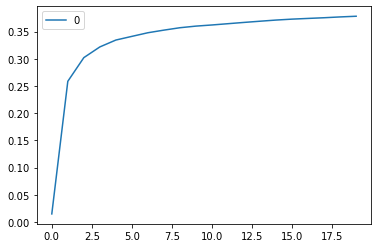

In [121]:
curve = pd.DataFrame(rmse_val) #elbow curve 
curve.plot()

In [128]:
#k=1
KNNmodel = neighbors.KNeighborsRegressor(n_neighbors = 1)
KNNmodel.fit(trainx, trainy)  

KNeighborsRegressor(n_neighbors=1)

In [129]:
KNNmodel.score(trainx,trainy)

0.9989620239016951

In [130]:
KNNmodel.score(testx,testy)

0.9988139513933809

In [131]:
y_pred=KNNmodel.predict(testx)
print(classification_report(testy, y_pred, target_names=['0','1']))

              precision    recall  f1-score   support

           0       1.00      1.00      1.00      6803
           1       1.00      1.00      1.00      2242

    accuracy                           1.00      9045
   macro avg       1.00      1.00      1.00      9045
weighted avg       1.00      1.00      1.00      9045



#  Gaussian Naive Bayes

In [133]:
from sklearn.naive_bayes import GaussianNB

In [134]:
gnb = GaussianNB()

In [135]:
gnb.fit(trainx, trainy)

GaussianNB()

In [136]:
GBtrain=gnb.score(trainx,trainy)

In [137]:
GBtest=gnb.score(testx,testy)

In [139]:
GBtrain

0.8087182463996462

In [140]:
GBtest

0.8093974571586512

In [141]:
y_pred=gnb.predict(testx)
print(classification_report(testy, y_pred, target_names=['0','1']))

              precision    recall  f1-score   support

           0       0.85      0.91      0.88      6803
           1       0.65      0.49      0.56      2242

    accuracy                           0.81      9045
   macro avg       0.75      0.70      0.72      9045
weighted avg       0.80      0.81      0.80      9045



# ExtraTreesClassifier

In [142]:
from sklearn.ensemble import ExtraTreesClassifier


In [143]:
ETCclf = ExtraTreesClassifier(n_estimators=100, random_state=0)

In [145]:
ETCclf.fit(trainx, trainy)

ExtraTreesClassifier(random_state=0)

In [146]:
ETCtrain=ETCclf.score(trainx,trainy)

In [147]:
ETCtest=ETCclf.score(testx,testy)

In [148]:
ETCtrain

0.9998065068966471

In [149]:
ETCtest

0.9995577667219459

In [150]:
y_pred=ETCclf.predict(testx)
print(classification_report(testy, y_pred, target_names=['0','1']))

              precision    recall  f1-score   support

           0       1.00      1.00      1.00      6803
           1       1.00      1.00      1.00      2242

    accuracy                           1.00      9045
   macro avg       1.00      1.00      1.00      9045
weighted avg       1.00      1.00      1.00      9045



# ANN 1

In [174]:
import tensorflow as tf
from keras.models import Sequential
from keras.layers import Dense

In [204]:
ANN1 = Sequential()

ANN1.add(Dense(8, activation='relu', input_shape=(14,)))

ANN1.add(Dense(8, activation='relu'))

ANN1.add(Dense(1, activation='sigmoid'))

In [205]:
ANN1.summary()

Model: "sequential_3"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_9 (Dense)              (None, 8)                 120       
_________________________________________________________________
dense_10 (Dense)             (None, 8)                 72        
_________________________________________________________________
dense_11 (Dense)             (None, 1)                 9         
Total params: 201
Trainable params: 201
Non-trainable params: 0
_________________________________________________________________


In [210]:
ANN1.compile(loss='binary_crossentropy',
              optimizer='sgd',
              metrics=['accuracy'])

In [211]:
ANN1.fit(trainx, trainy,epochs=4, batch_size=1, verbose=1)


Epoch 1/4
36177/36177 [==============================] - 20s 560us/step - loss: 0.5603 - accuracy: 0.7522
Epoch 2/4
36177/36177 [==============================] - 19s 534us/step - loss: 0.5604 - accuracy: 0.7522
Epoch 3/4
36177/36177 [==============================] - 19s 519us/step - loss: 0.5605 - accuracy: 0.7522
Epoch 4/4
36177/36177 [==============================] - 19s 521us/step - loss: 0.5604 - accuracy: 0.7522


In [212]:
_,ANN1test = ANN1.evaluate(testx, testy,verbose=1)

283/283 [==============================] - 0s 538us/step - loss: 0.5602 - accuracy: 0.7521


In [213]:
_,ANN1train = ANN1.evaluate(trainx, trainy,verbose=1)

1131/1131 [==============================] - 1s 529us/step - loss: 0.5601 - accuracy: 0.7522


In [219]:
y_pred=np.argmax(ANN1.predict(testx),axis=1)
print(classification_report(testy, y_pred, target_names=['0','1']))

              precision    recall  f1-score   support

           0       0.75      1.00      0.86      6803
           1       0.00      0.00      0.00      2242

    accuracy                           0.75      9045
   macro avg       0.38      0.50      0.43      9045
weighted avg       0.57      0.75      0.65      9045

